In [ ]:
#!pip install geopandas
#!pip install folium
#!pip install markupsafe==2.0.1
#!pip install pandas-profiling==3.2.0

In [ ]:
#importar librerias
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import math
from datetime import timedelta
# Statistical OLS Regression Analysis
%matplotlib inline
import statsmodels.api as sm
from statsmodels.compat import lzip
from statsmodels.formula.api import ols

#Scipy sklearn Predictions
from sklearn.metrics import f1_score, make_scorer
from sklearn.model_selection import KFold, cross_val_score

pd.options.display.max_columns = 1000
pd.options.display.float_format = '{:,.4f}'.format

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import plotly.express as px
import seaborn as sns

from collections import OrderedDict
from functools import partial
from time import time

from mpl_toolkits.mplot3d import Axes3D

from sklearn import svm, datasets #Support vector classifiers
import warnings
warnings.filterwarnings('ignore')

In [ ]:
def evaluate(model, X, Y):
    strat_k_fold = KFold(n_splits=3, shuffle=True, random_state=2022)
    scorer = make_scorer(f1_score, average='macro')
    return np.mean(cross_val_score(model, X, Y, scoring = scorer, cv = strat_k_fold))

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/BigDataDO/Datathon2022/main/Reto2/crime_data.csv', index_col=0).reset_index()
df.head(5)

,X,Y,DATETIME,TARGET
0,-76.6248,39.2530,2018-04-02 04:00:00+00:00,ASALTO
1,-76.5922,39.3433,2019-02-01 08:00:00+00:00,HURTO
2,-76.6257,39.2844,2017-09-27 21:00:00+00:00,HURTO
3,-76.4783,39.2702,2017-03-21 11:00:00+00:00,FALSO
4,-76.5760,39.2912,2017-03-07 02:00:00+00:00,ROBO


Vemos que el 39% de los casos dentro de nuestro dataset corresponden a casos de hurtos.

In [ ]:
df.TARGET.value_counts(normalize=True)

HURTO    0.3911
ASALTO   0.2938
ROBO     0.2170
FALSO    0.0982
Name: TARGET, dtype: float64

In [ ]:
# Convertimos DATETIME a un valor numérico para usarlo en el modelo
df['DATETIME'] = pd.to_datetime(df['DATETIME'])
# Convert time objects
df['date'] = [d.date() for d in df['DATETIME']]
#df['time'] = [d.time() for d in df['DATETIME']]
df['day'] = df['DATETIME'].dt.day_name()
df['month'] = df['DATETIME'].dt.month_name()
df['hora'] = df['DATETIME'].dt.hour #hora del dia
# Find Fractions of Day
df['timeint'] = (df['DATETIME']-df['DATETIME'].dt.normalize()).dt.total_seconds()/timedelta(days=1).total_seconds() #NORMALIZAR MOMENTO DEL DIA EN TERMINOS DE 1 DIA COMPLETO (0-1)

In [ ]:
df.head()

,X,Y,DATETIME,TARGET,date,day,month,hora,timeint
0,-76.6248,39.2530,2018-04-02 04:00:00+00:00,ASALTO,2018-04-02,Monday,April,4,0.1667
1,-76.5922,39.3433,2019-02-01 08:00:00+00:00,HURTO,2019-02-01,Friday,February,8,0.3333
2,-76.6257,39.2844,2017-09-27 21:00:00+00:00,HURTO,2017-09-27,Wednesday,September,21,0.8750
3,-76.4783,39.2702,2017-03-21 11:00:00+00:00,FALSO,2017-03-21,Tuesday,March,11,0.4583
4,-76.5760,39.2912,2017-03-07 02:00:00+00:00,ROBO,2017-03-07,Tuesday,March,2,0.0833


Sacar los valores falsos

In [ ]:
# df_falsos = df[df.TARGET == 'FALSO']
# df_completo = df
# df = df[df.TARGET != 'FALSO']
# df

In [ ]:
df['DATETIME'] = df['DATETIME'].astype(np.int64)

# Aumento de datos

In [ ]:
df['X'] = df['X'].round(3)
df['Y'] = df['Y'].round(3)
df

,X,Y,DATETIME,TARGET,date,day,month,hora,timeint
0,-76.6250,39.2530,1522641600000000000,ASALTO,2018-04-02,Monday,April,4,0.1667
1,-76.5920,39.3430,1549008000000000000,HURTO,2019-02-01,Friday,February,8,0.3333
2,-76.6260,39.2840,1506546000000000000,HURTO,2017-09-27,Wednesday,September,21,0.8750
3,-76.4780,39.2700,1490094000000000000,FALSO,2017-03-21,Tuesday,March,11,0.4583
4,-76.5760,39.2910,1488852000000000000,ROBO,2017-03-07,Tuesday,March,2,0.0833
...,...,...,...,...,...,...,...,...,...
236365,-76.6140,39.2770,1484996400000000000,HURTO,2017-01-21,Saturday,January,11,0.4583
236366,-76.5610,38.7340,1506967200000000000,FALSO,2017-10-02,Monday,October,18,0.7500
236367,-76.5970,39.2340,1502017200000000000,HURTO,2017-08-06,Sunday,August,11,0.4583
236368,-76.6400,39.3080,1546776000000000000,HURTO,2019-01-06,Sunday,January,12,0.5000


Crear las variables extraidas de los datos de geolocalizacion:

In [ ]:
df_geo_unica = df[['Y', 'X']].drop_duplicates().reset_index()
del df_geo_unica['index']
df_geo_unica

,Y,X
0,39.2530,-76.6250
1,39.3430,-76.5920
2,39.2840,-76.6260
3,39.2700,-76.4780
4,39.2910,-76.5760
...,...,...
35881,39.3340,-76.4570
35882,38.9220,-76.7580
35883,39.1210,-76.6210
35884,39.2760,-76.7710


In [ ]:
# from geopy.geocoders import GoogleV3

# #rows=[{'avg_lat':52.509669, 'avg_lon':13.376294}]

# def get_component(location, component_type):
#     for component in location.raw['address_components']:
#         if component_type in component['types']:
#             return component['long_name']

# #location.raw

# #df_geo_unica = df_geo_unica.iloc[:20]

# post_code_list = []
# state_list = []
# neighbourhood_list = []
# locality_list = []
# street_number_list = []
# street_name_list = []

# for i, j in zip(df_geo_unica["Y"], df_geo_unica['X']):
#     location = geolocator.reverse((i,j), timeout = 500,  exactly_one=True)
#     post_code = get_component(location, 'postal_code') #funciono
#     post_code_list.append(post_code)
    
# df_geo_unica['post_code'] = post_code_list
# df_geo_unica.head(5)

In [ ]:
#df_geo_unica.to_excel('data_santa_cono.xlsx')

In [ ]:
df_geo_unica = pd.read_excel('https://github.com/josegarciav/Datathon_2022/blob/main/data_geopy.xlsx?raw=true') #

In [ ]:
df_geo_unica.isna().sum() #Hay 83 valores nulos

Unnamed: 0     0
Y              0
X              0
post_code     83
dtype: int64

In [ ]:
num = df_geo_unica['post_code'].mode()[0]
df_geo_unica['post_code'].fillna(num, inplace=True)
df_geo_unica.post_code = df_geo_unica.post_code.astype(str)
del df_geo_unica['Unnamed: 0']
df_geo_unica.post_code = df_geo_unica.post_code.replace(r'\.0$', '', regex=True)

In [ ]:
df_geo_unica

,Y,X,post_code
0,39.2530,-76.6250,21225
1,39.3430,-76.5920,21218
2,39.2840,-76.6260,21230
3,39.2910,-76.5760,21224
4,39.2850,-76.6800,21229
...,...,...,...
14799,39.3370,-76.6970,21207
14800,39.2750,-76.7000,21229
14801,39.3250,-76.6690,21215
14802,39.3450,-76.6970,21215


In [ ]:
#zip_codes_dataset = pd.read_csv('zip_lat_long.csv')

In [ ]:
df11 = pd.merge(df, df_geo_unica, how='left', left_on=['Y','X'], right_on = ['Y','X'])
df11

,X,Y,DATETIME,TARGET,date,day,month,hora,timeint,post_code
0,-76.6250,39.2530,1522641600000000000,ASALTO,2018-04-02,Monday,April,4,0.1667,21225
1,-76.5920,39.3430,1549008000000000000,HURTO,2019-02-01,Friday,February,8,0.3333,21218
2,-76.6260,39.2840,1506546000000000000,HURTO,2017-09-27,Wednesday,September,21,0.8750,21230
3,-76.4780,39.2700,1490094000000000000,FALSO,2017-03-21,Tuesday,March,11,0.4583,NaN
4,-76.5760,39.2910,1488852000000000000,ROBO,2017-03-07,Tuesday,March,2,0.0833,21224
...,...,...,...,...,...,...,...,...,...,...
236365,-76.6140,39.2770,1484996400000000000,HURTO,2017-01-21,Saturday,January,11,0.4583,21230
236366,-76.5610,38.7340,1506967200000000000,FALSO,2017-10-02,Monday,October,18,0.7500,NaN
236367,-76.5970,39.2340,1502017200000000000,HURTO,2017-08-06,Sunday,August,11,0.4583,21225
236368,-76.6400,39.3080,1546776000000000000,HURTO,2019-01-06,Sunday,January,12,0.5000,21217


Luego de que tenemos la variable del zip code, agregamos las demas variables obtenidas desde un excel externo. 

In [ ]:
#from google.colab import files

#uploaded = files.upload()

#for fn in uploaded.keys():
#    print('User uploaded file "{name}" with length {length} bytes'.format(
 #       name=fn, length=len(uploaded[fn])))

In [ ]:
us_zips = pd.read_excel('https://github.com/josegarciav/Datathon_2022/blob/main/uszips_nuevo.xlsx?raw=true',na_values=['NaN', 'nan', ''])
del us_zips['parent_zcta']
us_zips.zip = us_zips.zip.astype(str)
us_zips

,zip,lat,lng,city,state_id,state_name,zcta,population,density,county_fips,county_name,county_weights,county_names_all,county_fips_all,imprecise,military,timezone,age_median,male,female,married,family_size,income_household_median,income_household_six_figure,home_ownership,home_value,rent_median,education_college_or_above,labor_force_participation,unemployment_rate,race_white,race_black,race_asian,race_native,race_pacific,race_other,race_multiple
0,501,40.8131,-73.0464,Holtsville,NY,New York,False,NaN,NaN,"36,103.0000",Suffolk,"{""36103"": 100}",Suffolk,36103,False,False,America/New_York,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,544,40.8132,-73.0493,Holtsville,NY,New York,False,NaN,NaN,"36,103.0000",Suffolk,"{""36103"": 100}",Suffolk,36103,False,False,America/New_York,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,601,18.1803,-66.7527,Adjuntas,PR,Puerto Rico,True,"16,773.0000",100.5000,"72,001.0000",Adjuntas,"{""72001"": 98.73, ""72141"": 1.27}",Adjuntas|Utuado,72001|72141,False,False,America/Puerto_Rico,42.9000,49.6000,50.4000,37.1000,3.6700,"14,398.0000",0.9000,64.1000,"79,328.0000",385.0000,15.7000,37.8000,30.6000,72.9000,1.5000,0.0000,0.1000,0.0000,22.1000,3.3000
3,602,18.3607,-67.1754,Aguada,PR,Puerto Rico,True,"37,083.0000",472.1000,"72,003.0000",Aguada,"{""72003"": 100}",Aguada,72003,False,False,America/Puerto_Rico,43.6000,48.9000,51.1000,40.1000,3.4600,"16,771.0000",2.7000,76.5000,"89,654.0000",393.0000,20.5000,37.4000,7.8000,76.5000,2.7000,0.0000,0.3000,0.0000,3.2000,17.3000
4,603,18.4574,-67.1222,Aguadilla,PR,Puerto Rico,True,"45,652.0000",513.2000,"72,005.0000",Aguadilla,"{""72005"": 99.76, ""72099"": 0.24}",Aguadilla|Moca,72005|72099,False,False,America/Puerto_Rico,43.2000,48.6000,51.4000,38.5000,2.7500,"15,786.0000",3.4000,57.1000,"112,361.0000",418.0000,23.2000,38.4000,17.7000,78.0000,3.6000,0.1000,0.2000,0.0000,13.7000,4.4000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41689,99929,56.3609,-132.0063,Wrangell,AK,Alaska,True,"2,509.0000",0.4000,"2,275.0000",Wrangell,"{""02275"": 100}",Wrangell,2275,False,False,America/Sitka,47.7000,54.0000,46.0000,54.1000,3.0300,"58,542.0000",27.4000,71.3000,"218,605.0000",868.0000,16.9000,55.4000,6.0000,65.2000,0.3000,1.7000,22.8000,1.3000,0.5000,8.3000
41690,99950,55.3400,-131.6400,Ketchikan,AK,Alaska,False,NaN,NaN,"2,130.0000",Ketchikan Gateway,"{""02130"": 100}",Ketchikan Gateway,2130,False,False,America/Sitka,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
41691,13021,42.9171,-76.5542,Auburn,NY,New York,True,"37,528.0000",121.6000,"36,011.0000",Cayuga,"{""36011"": 99.67, ""36067"": 0.33}",Cayuga|Onondaga,36011|36067,False,False,America/New_York,43.3000,48.2000,51.8000,42.4000,2.8400,"51,517.0000",22.2000,60.9000,"132,537.0000",750.0000,24.6000,59.5000,6.0000,90.4000,3.5000,0.7000,0.1000,0.0000,0.8000,4.5000
41692,13022,42.9200,-76.5529,Auburn,NY,New York,False,NaN,NaN,"36,011.0000",Cayuga,"{""36011"": 100}",Cayuga,36011,False,False,America/New_York,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df12 = pd.merge(df11, us_zips[['zip','city', 'state_name','county_name', 'age_median', 
                               'male', 'female', 'married', 'family_size', 'income_household_median', 'income_household_six_figure', 
                               'home_ownership', 'home_value', 'rent_median', 'education_college_or_above', 
                               'labor_force_participation', 'unemployment_rate']], how='left', left_on=['post_code'], right_on = ['zip'])
df12

,X,Y,DATETIME,TARGET,date,day,month,hora,timeint,post_code,zip,city,state_name,county_name,age_median,male,female,married,family_size,income_household_median,income_household_six_figure,home_ownership,home_value,rent_median,education_college_or_above,labor_force_participation,unemployment_rate
0,-76.6250,39.2530,1522641600000000000,ASALTO,2018-04-02,Monday,April,4,0.1667,21225,21225,Brooklyn,Maryland,Anne Arundel,34.9000,47.9000,52.1000,32.0000,3.4800,"39,831.0000",15.7000,51.7000,"163,672.0000",896.0000,12.1000,59.7000,10.0000
1,-76.5920,39.3430,1549008000000000000,HURTO,2019-02-01,Friday,February,8,0.3333,21218,21218,Baltimore,Maryland,Baltimore,35.6000,50.8000,49.2000,24.4000,3.3200,"51,276.0000",23.8000,48.2000,"174,371.0000","1,088.0000",40.2000,60.5000,9.8000
2,-76.6260,39.2840,1506546000000000000,HURTO,2017-09-27,Wednesday,September,21,0.8750,21230,21230,Baltimore,Maryland,Baltimore,32.6000,47.4000,52.6000,34.1000,3.1000,"85,310.0000",44.6000,51.2000,"276,684.0000","1,502.0000",55.4000,74.5000,4.2000
3,-76.4780,39.2700,1490094000000000000,FALSO,2017-03-21,Tuesday,March,11,0.4583,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-76.5760,39.2910,1488852000000000000,ROBO,2017-03-07,Tuesday,March,2,0.0833,21224,21224,Baltimore,Maryland,Baltimore,33.3000,50.0000,50.0000,35.8000,3.2800,"79,975.0000",40.7000,58.4000,"228,174.0000","1,555.0000",44.4000,72.5000,4.6000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236365,-76.6140,39.2770,1484996400000000000,HURTO,2017-01-21,Saturday,January,11,0.4583,21230,21230,Baltimore,Maryland,Baltimore,32.6000,47.4000,52.6000,34.1000,3.1000,"85,310.0000",44.6000,51.2000,"276,684.0000","1,502.0000",55.4000,74.5000,4.2000
236366,-76.5610,38.7340,1506967200000000000,FALSO,2017-10-02,Monday,October,18,0.7500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
236367,-76.5970,39.2340,1502017200000000000,HURTO,2017-08-06,Sunday,August,11,0.4583,21225,21225,Brooklyn,Maryland,Anne Arundel,34.9000,47.9000,52.1000,32.0000,3.4800,"39,831.0000",15.7000,51.7000,"163,672.0000",896.0000,12.1000,59.7000,10.0000
236368,-76.6400,39.3080,1546776000000000000,HURTO,2019-01-06,Sunday,January,12,0.5000,21217,21217,Baltimore,Maryland,Baltimore,39.4000,50.3000,49.7000,19.1000,3.4800,"31,570.0000",14.3000,33.2000,"168,632.0000",904.0000,19.0000,53.1000,10.8000


In [ ]:
# # !pip install -U pandas-profiling
# from pandas_profiling import ProfileReport #para ver diagnostico de la data obtenida
# profile = ProfileReport(df12, title = "Reporte")
# profile.to_widgets()

In [ ]:
df12.isna().sum() #Sacar valores null

X                                  0
Y                                  0
DATETIME                           0
TARGET                             0
date                               0
day                                0
month                              0
hora                               0
timeint                            0
post_code                      21970
zip                            22020
city                           22020
state_name                     22020
county_name                    22020
age_median                     22775
male                           22775
female                         22775
married                        22775
family_size                    22817
income_household_median        22817
income_household_six_figure    22817
home_ownership                 22817
home_value                     24149
rent_median                    22817
education_college_or_above     22775
labor_force_participation      22775
unemployment_rate              22775
d

In [ ]:
#df12['population'] = df12['population'].astype(int)
#df12['density'] = df12['density'].astype(int)

num1 = df12['city'].mode()[0] #Entre 689 y 124 valores nulls en las siguientes columnas
df12['city'].fillna(num1, inplace=True)

num1 = df12['state_name'].mode()[0]
df12['state_name'].fillna(num1, inplace=True)

num1 = df12['county_name'].mode()[0]
df12['county_name'].fillna(num1, inplace=True)

num1 = df12['zip'].mode()[0]
df12['zip'].fillna(num1, inplace=True)

num1 = df12['age_median'].median()
df12['age_median'].fillna(num1, inplace=True)

num1 = df12['male'].median()
df12['male'].fillna(num1, inplace=True)
num1 = df12['female'].median()
df12['female'].fillna(num1, inplace=True)
num1 = df12['married'].median()
df12['married'].fillna(num1, inplace=True)
num1 = df12['family_size'].median()
df12['family_size'].fillna(num1, inplace=True)
num1 = df12['income_household_median'].median()
df12['income_household_median'].fillna(num1, inplace=True)
num1 = df12['income_household_six_figure'].median()
df12['income_household_six_figure'].fillna(num1, inplace=True)
num1 = df12['home_ownership'].median()
df12['home_ownership'].fillna(num1, inplace=True)
num1 = df12['home_value'].median()
df12['home_value'].fillna(num1, inplace=True)
num1 = df12['rent_median'].median()
df12['rent_median'].fillna(num1, inplace=True)
num1 = df12['education_college_or_above'].median()
df12['education_college_or_above'].fillna(num1, inplace=True)
num1 = df12['labor_force_participation'].median()
df12['labor_force_participation'].fillna(num1, inplace=True)
num1 = df12['unemployment_rate'].median()
df12['unemployment_rate'].fillna(num1, inplace=True)

In [ ]:
df12.isna().sum()

X                                  0
Y                                  0
DATETIME                           0
TARGET                             0
date                               0
day                                0
month                              0
hora                               0
timeint                            0
post_code                      21970
zip                                0
city                               0
state_name                         0
county_name                        0
age_median                         0
male                               0
female                             0
married                            0
family_size                        0
income_household_median            0
income_household_six_figure        0
home_ownership                     0
home_value                         0
rent_median                        0
education_college_or_above         0
labor_force_participation          0
unemployment_rate                  0
d

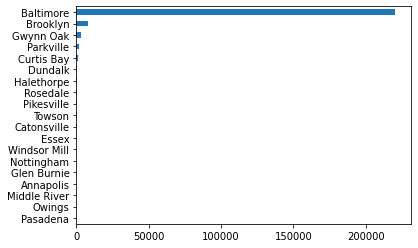

In [ ]:
df12.city.value_counts(ascending=True).plot(kind='barh') #Principales ciudades/barrios

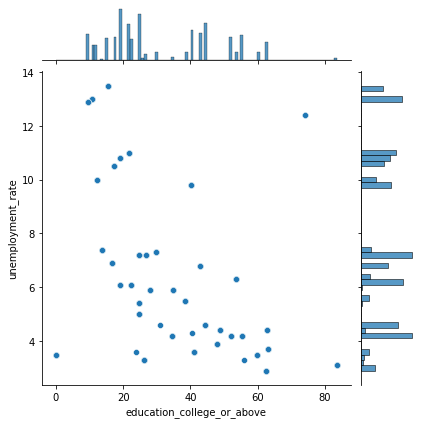

In [ ]:
sns.jointplot(x='education_college_or_above',y='unemployment_rate',data=df12) #Relacion entre education_college_or_above y densidad de unemployment_rate

In [ ]:
df_grouped = df12.groupby(['TARGET', 'city']).size().reset_index(name='counts')

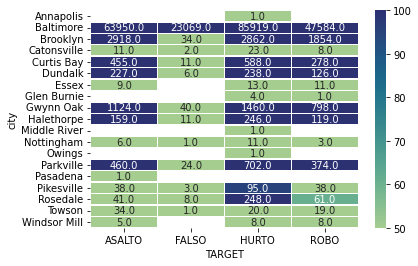

In [ ]:
df_heatmap = df_grouped.pivot_table(values ='counts', index='city',columns='TARGET',aggfunc=np.sum)
sns.heatmap(df_heatmap, annot=True, fmt=".1f", linewidth=.5, cmap="crest", vmin=50, vmax=100)
plt.show() #Cantidad de crimenes distribuidos por ciudades

In [ ]:
df12

,X,Y,DATETIME,TARGET,date,day,month,hora,timeint,post_code,zip,city,state_name,county_name,age_median,male,female,married,family_size,income_household_median,income_household_six_figure,home_ownership,home_value,rent_median,education_college_or_above,labor_force_participation,unemployment_rate
0,-76.6250,39.2530,1522641600000000000,ASALTO,2018-04-02,Monday,April,4,0.1667,21225,21225,Brooklyn,Maryland,Anne Arundel,34.9000,47.9000,52.1000,32.0000,3.4800,"39,831.0000",15.7000,51.7000,"163,672.0000",896.0000,12.1000,59.7000,10.0000
1,-76.5920,39.3430,1549008000000000000,HURTO,2019-02-01,Friday,February,8,0.3333,21218,21218,Baltimore,Maryland,Baltimore,35.6000,50.8000,49.2000,24.4000,3.3200,"51,276.0000",23.8000,48.2000,"174,371.0000","1,088.0000",40.2000,60.5000,9.8000
2,-76.6260,39.2840,1506546000000000000,HURTO,2017-09-27,Wednesday,September,21,0.8750,21230,21230,Baltimore,Maryland,Baltimore,32.6000,47.4000,52.6000,34.1000,3.1000,"85,310.0000",44.6000,51.2000,"276,684.0000","1,502.0000",55.4000,74.5000,4.2000
3,-76.4780,39.2700,1490094000000000000,FALSO,2017-03-21,Tuesday,March,11,0.4583,NaN,21224,Baltimore,Maryland,Baltimore,36.0000,47.6000,52.4000,25.4000,3.3500,"46,937.0000",20.9000,50.9000,"168,632.0000","1,088.0000",24.6000,60.5000,7.2000
4,-76.5760,39.2910,1488852000000000000,ROBO,2017-03-07,Tuesday,March,2,0.0833,21224,21224,Baltimore,Maryland,Baltimore,33.3000,50.0000,50.0000,35.8000,3.2800,"79,975.0000",40.7000,58.4000,"228,174.0000","1,555.0000",44.4000,72.5000,4.6000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236365,-76.6140,39.2770,1484996400000000000,HURTO,2017-01-21,Saturday,January,11,0.4583,21230,21230,Baltimore,Maryland,Baltimore,32.6000,47.4000,52.6000,34.1000,3.1000,"85,310.0000",44.6000,51.2000,"276,684.0000","1,502.0000",55.4000,74.5000,4.2000
236366,-76.5610,38.7340,1506967200000000000,FALSO,2017-10-02,Monday,October,18,0.7500,NaN,21224,Baltimore,Maryland,Baltimore,36.0000,47.6000,52.4000,25.4000,3.3500,"46,937.0000",20.9000,50.9000,"168,632.0000","1,088.0000",24.6000,60.5000,7.2000
236367,-76.5970,39.2340,1502017200000000000,HURTO,2017-08-06,Sunday,August,11,0.4583,21225,21225,Brooklyn,Maryland,Anne Arundel,34.9000,47.9000,52.1000,32.0000,3.4800,"39,831.0000",15.7000,51.7000,"163,672.0000",896.0000,12.1000,59.7000,10.0000
236368,-76.6400,39.3080,1546776000000000000,HURTO,2019-01-06,Sunday,January,12,0.5000,21217,21217,Baltimore,Maryland,Baltimore,39.4000,50.3000,49.7000,19.1000,3.4800,"31,570.0000",14.3000,33.2000,"168,632.0000",904.0000,19.0000,53.1000,10.8000


In [ ]:
df2 = pd.get_dummies(df12, prefix_sep='_', columns = ['day', 'month'], drop_first=True)

In [ ]:
df2.shape

(236370, 42)

In [ ]:
X = df2[df2.columns.difference(['TARGET', 'date', 'DATETIME', 'state_name', 
                                'density','population', 'post_code', 'zip', 'hora','city', 'county_name'])] #excluir columnas marcadas
Y = df2['TARGET']
XX = df2[df2.columns.difference(['TARGET', 'date', 'DATETIME', 'state_name', 
                                'density','population', 'post_code', 'zip', 'hora','city', 'county_name'])] #excluir columnas marcadas
YY = df2['TARGET']
X.shape

(236370, 33)

In [ ]:
X #VARIABLES USADAS EN EL MODELO PARA PREDECIR

,X,Y,age_median,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,education_college_or_above,family_size,female,home_ownership,home_value,income_household_median,income_household_six_figure,labor_force_participation,male,married,month_August,month_December,month_February,month_January,month_July,month_June,month_March,month_May,month_November,month_October,month_September,rent_median,timeint,unemployment_rate
0,-76.6250,39.2530,34.9000,1,0,0,0,0,0,12.1000,3.4800,52.1000,51.7000,"163,672.0000","39,831.0000",15.7000,59.7000,47.9000,32.0000,0,0,0,0,0,0,0,0,0,0,0,896.0000,0.1667,10.0000
1,-76.5920,39.3430,35.6000,0,0,0,0,0,0,40.2000,3.3200,49.2000,48.2000,"174,371.0000","51,276.0000",23.8000,60.5000,50.8000,24.4000,0,0,1,0,0,0,0,0,0,0,0,"1,088.0000",0.3333,9.8000
2,-76.6260,39.2840,32.6000,0,0,0,0,0,1,55.4000,3.1000,52.6000,51.2000,"276,684.0000","85,310.0000",44.6000,74.5000,47.4000,34.1000,0,0,0,0,0,0,0,0,0,0,1,"1,502.0000",0.8750,4.2000
3,-76.4780,39.2700,36.0000,0,0,0,0,1,0,24.6000,3.3500,52.4000,50.9000,"168,632.0000","46,937.0000",20.9000,60.5000,47.6000,25.4000,0,0,0,0,0,0,1,0,0,0,0,"1,088.0000",0.4583,7.2000
4,-76.5760,39.2910,33.3000,0,0,0,0,1,0,44.4000,3.2800,50.0000,58.4000,"228,174.0000","79,975.0000",40.7000,72.5000,50.0000,35.8000,0,0,0,0,0,0,1,0,0,0,0,"1,555.0000",0.0833,4.6000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236365,-76.6140,39.2770,32.6000,0,1,0,0,0,0,55.4000,3.1000,52.6000,51.2000,"276,684.0000","85,310.0000",44.6000,74.5000,47.4000,34.1000,0,0,0,1,0,0,0,0,0,0,0,"1,502.0000",0.4583,4.2000
236366,-76.5610,38.7340,36.0000,1,0,0,0,0,0,24.6000,3.3500,52.4000,50.9000,"168,632.0000","46,937.0000",20.9000,60.5000,47.6000,25.4000,0,0,0,0,0,0,0,0,0,1,0,"1,088.0000",0.7500,7.2000
236367,-76.5970,39.2340,34.9000,0,0,1,0,0,0,12.1000,3.4800,52.1000,51.7000,"163,672.0000","39,831.0000",15.7000,59.7000,47.9000,32.0000,1,0,0,0,0,0,0,0,0,0,0,896.0000,0.4583,10.0000
236368,-76.6400,39.3080,39.4000,0,0,1,0,0,0,19.0000,3.4800,49.7000,33.2000,"168,632.0000","31,570.0000",14.3000,53.1000,50.3000,19.1000,0,0,0,1,0,0,0,0,0,0,0,904.0000,0.5000,10.8000


In [ ]:
scaler = StandardScaler()
scaler.fit(X)
x = scaler.transform(X)
x.shape

(236370, 33)

In [ ]:
x

array([[-0.18973649, -0.2785474 , -0.36806122, ..., -1.20225882,
        -1.24310391,  0.63884624],
       [ 0.4034679 ,  0.60470085, -0.1465781 , ..., -0.23070926,
        -0.67391346,  0.57596054],
       [-0.20771238,  0.02568255, -1.09579144, ...,  1.86419447,
         1.17595547, -1.1848389 ],
       ...,
       [ 0.31358845, -0.46501092, -0.36806122, ..., -1.20225882,
        -0.24702063,  0.63884624],
       [-0.45937484,  0.26121542,  1.05575879, ..., -1.16177758,
        -0.10472302,  0.89038902],
       [ 0.11585365,  0.31028477, -0.1465781 , ..., -0.23070926,
        -0.24702063,  0.57596054]])

## Analisis de componentes principales

In [ ]:
target = Y
data_test = pd.DataFrame(target, columns = ['TARGET'], index=None).reset_index()
data_test

,index,TARGET
0,0,ASALTO
1,1,HURTO
2,2,HURTO
3,3,FALSO
4,4,ROBO
...,...,...
236365,236365,HURTO
236366,236366,FALSO
236367,236367,HURTO
236368,236368,HURTO


In [ ]:
pca = PCA(n_components=2).fit(x)
new_df = pca.transform(x)
new_df = pd.DataFrame(new_df, columns = ['PC1','PC2']).reset_index()

In [ ]:
X = x
#Concat it with target variable to create a complete Dataset.
principal_df = pd.concat([new_df, data_test], axis = 1).drop(columns = 'index')
principal_df

,PC1,PC2,TARGET
0,-1.6006,0.3080,ASALTO
1,0.0350,-1.0749,HURTO
2,4.6090,0.7367,HURTO
3,-0.2200,0.1397,FALSO
4,3.9573,0.5064,ROBO
...,...,...,...
236365,4.6402,0.7395,HURTO
236366,-0.3626,-0.1643,FALSO
236367,-1.5323,0.3066,HURTO
236368,-2.6776,-1.6401,HURTO


Scores plot

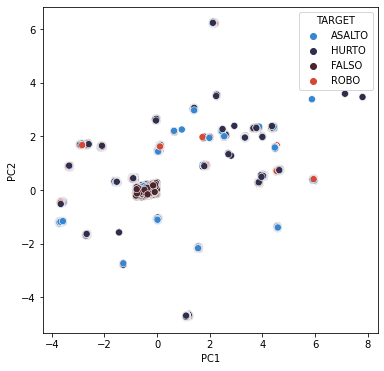

In [ ]:
plt.figure(figsize = (6,6))
plot2dpca = sns.scatterplot(data = principal_df, x = 'PC1', y = 'PC2', hue = 'TARGET', s = 50, palette = 'icefire')
plot2dpca #valor atipico mal clasificado

Loadings values para saber cuales son las variables mas significativas dentro de la discriminacion de un crimen:

In [ ]:
pca = PCA(n_components=2).fit(X)
new_df = pca.transform(X)
loadings = pca.components_.T

In [ ]:
pd.concat([pd.DataFrame(df2[df2.columns.difference(['TARGET', 'date', 
                                                    'DATETIME', 'state_name', 
                                                    'density','population', 
                                                    'post_code', 'zip', 'income_household_median', 'home_value', 'city', 'county_name'])].columns.T, columns = ['Descriptors']),
           pd.DataFrame({'PC1': loadings[:, 0], 'PC2': loadings[:, 1]})],
           axis = 1).sort_values('PC1', ascending=False)

In [ ]:
# Explained variance by each Principal Component: PC1 wins
pca = PCA(n_components=10).fit(X)
new_df = pca.transform(X)
var_exp = pca.explained_variance_.T
var_exp

In [ ]:
pca = PCA(n_components=3).fit(X)
new_df = pca.transform(X)
new_df = pd.DataFrame(new_df, columns = ['PC1','PC2', 'PC3']).reset_index()

#Concat it with target variable to create a complete Dataset.
principal_df3 = pd.concat([new_df, data_test], axis = 1).drop(columns = 'index')
principal_df3

Vemos como se hacen 3 grupos visualmente distinguibles principales, en donde los falsos siempre se entremezclan con las demas clases. Por medidas de dispersion entre donde suelen encontrarse los asaltos y/o hurtos dentro de cada uno de los clusteres armados podriamos empezar a reclasificar las clases mal clasificadas.

In [ ]:
fig = px.scatter_3d(principal_df3, x="PC1", y="PC2", z="PC3", color="TARGET", hover_name="TARGET",
                    symbol="TARGET", color_discrete_map = {"PC1": "blue", "PC2": "green", "PC3":"red"})
fig.show()

## Armando un dataset nuevo con los valores obtenidos con tecnica de reduccion de dimensionalidad PCA

In [ ]:
# pca = PCA(n_components=10).fit(x)
# new_df_PCAMODELS = pca.transform(x)
# new_df_PCAMODELS = pd.DataFrame(new_df_PCAMODELS, columns = ['PC1','PC2',
#                                                              'PC12','PC22',
#                                                              'PC13','PC23',
#                                                              'PC14','PC24',
#                                                              'PC15','PC25',]).reset_index()

In [ ]:
# new_df_PCAMODELS2 = pd.concat([new_df_PCAMODELS, data_test], axis = 1).drop(columns = 'index')
# new_df_PCAMODELS2

In [ ]:
# X = new_df_PCAMODELS2[new_df_PCAMODELS2.columns.difference(['TARGET'])] #excluir columnas marcadas
# Xpca = new_df_PCAMODELS2[new_df_PCAMODELS2.columns.difference(['TARGET'])] #excluir columnas marcadas
# Y = new_df_PCAMODELS2['TARGET']

# X.shape

# Modelo 1: DecisionTreeClassifier

In [ ]:
def metricas_modelos(y_true, y_pred):
    from sklearn.metrics import accuracy_score, auc, confusion_matrix, f1_score, precision_score, recall_score, roc_curve

    # Obtención de matriz de confusión
    confusion_matrix = confusion_matrix(y_true, y_pred)

    print("La matriz de confusión es ")
    print(confusion_matrix)

    print('Precisión:', accuracy_score(y_true, y_pred ))
    print('Exactitud:', precision_score(y_true, y_pred, average='weighted'))
    print('Exhaustividad:', recall_score(y_true, y_pred, average='weighted'))
    print('F1:', f1_score(y_true, y_pred, average='weighted'))

## Division del dataset en training y testing

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(x, Y, test_size=0.20, stratify=Y) #Estratificar en base a la variable objetivo

In [ ]:
# Modelo de árbol sencillo
from sklearn.tree import DecisionTreeClassifier
model_decision_tree = DecisionTreeClassifier(random_state=42, max_depth=20)

In [ ]:
model_decision_tree.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=20, random_state=42)

In [ ]:
predicted_y_DT = model_decision_tree.predict(X_test)

In [ ]:
evaluate(model_decision_tree, X_test, y_test) #F1 Score

0.525503018967581

In [ ]:
metricas_modelos(y_test, predicted_y_DT) #Otras metricas del modelo

In [ ]:
from sklearn import tree
from IPython.display import Image
import pydotplus

cltree2 = tree.DecisionTreeClassifier(min_samples_leaf=20,max_depth=4)
cltree2.fit(X_train,y_train)
dot_data2 = tree.export_graphviz(cltree2,out_file=None,feature_names=XX.columns,filled=True)
graph2 = pydotplus.graph_from_dot_data(dot_data2)
Image(graph2.create_png())

In [ ]:
#Vamos a ver nuestros arboles
from sklearn import tree

fig, axes = plt.subplots(nrows = 1, ncols=1, figsize=(15,10), dpi=400)
tree.plot_tree(cltree2,
              feature_names=XX.columns.tolist(),
              filled=True,
              fontsize=8)

# Modelo 2: AdaBoostClassifier

Este modelo aplica ponderaciones especiales a las observaciones mal clasificadas.

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

In [ ]:
ada_cl = AdaBoostClassifier(learning_rate=0.8, n_estimators=500) #dura +-10 minutos entrenando
ada_cl.fit(X_train, y_train)

AdaBoostClassifier(learning_rate=0.8, n_estimators=500)

In [ ]:
predicted_y_ada = ada_cl.predict(X_test)

In [ ]:
evaluate(ada_cl, X_test, y_test) #F1 Score

0.4885402818119242

In [ ]:
metricas_modelos(y_test, predicted_y_ada)

La matriz de confusión es 
[[ 4295    10  9392   191]
 [   63  4385   186     8]
 [ 3202    16 15086   184]
 [ 2376     2  7635   243]]
Precisión: 0.5078690189110293
Exactitud: 0.4914388049324924
Exhaustividad: 0.5078690189110293
F1: 0.4430537865506229


# Modelo 3: XGBoost

In [ ]:
import xgboost as xgb
# from sklearn.model_selection import GridSearchCV

In [ ]:
modelxgboost = xgb.XGBClassifier(n_estimators=100, learning_rate=0.9, 
                                 n_jobs=-1, random_state = 42)

# parametros = {
#     'base_estimator__max_depth' : range(3,10),
#     'gamma' : [0.01,0.74],
#     'subsample':[0.3,0.9],
#     'colsample_bytree':[0.3,0.9],
#     'reg_alpha':[1e-3,0.1,1]}

# grid_search = GridSearchCV(modelxgboost, parametros, n_jobs=-1, cv=5, scoring='f1') # acccuracy
modelxgboost.fit(X_train, y_train)

XGBClassifier(learning_rate=0.9, n_jobs=-1, objective='multi:softprob',
              random_state=42)

In [ ]:
# grid_search.fit(X_train, y_train)
# modelxgboost = grid_search.best_estimator_

In [ ]:
predicted_yXG = modelxgboost.predict(X_test)

In [ ]:
metricas_modelos(y_test, predicted_yXG)

La matriz de confusión es 
[[ 6025     0  7447   416]
 [   69  4397   160    16]
 [ 4134     2 13871   481]
 [ 3134     0  6523   599]]
Precisión: 0.5265473621864026
Exactitud: 0.5102936095110662
Exhaustividad: 0.5265473621864026
F1: 0.4808805318378302


In [ ]:
# grid_search.best_params_ #Parametros seleccionados al final

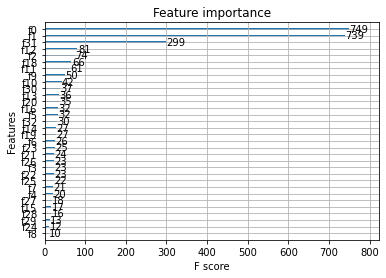

In [ ]:
xgb.plot_importance(modelxgboost, show_values=True) #Variable latitud la mas importante

# Modelo 4: LightGBM

In [ ]:
# build the lightgbm model
import lightgbm as lgb
clf_lightgbm = lgb.LGBMClassifier(max_depth=50, learning_rate=1, n_estimators=500)
clf_lightgbm.fit(X_train, y_train)

y_pred_lightgbm=clf_lightgbm.predict(X_test)

In [ ]:
evaluate(clf_lightgbm, X_test, y_test) #F1 Score

0.3989027796188216

In [ ]:
metricas_modelos(y_test, y_pred_lightgbm)

La matriz de confusión es 
[[4700 1138 4852 3198]
 [ 289 3580  453  320]
 [6000 1573 6895 4020]
 [3299  815 3978 2164]]
Precisión: 0.36677666370520795
Exactitud: 0.36117399979793025
Exhaustividad: 0.36677666370520795
F1: 0.36047168798324375


# Modelo 5: RandomForestClassifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_cl = RandomForestClassifier(n_estimators=200,n_jobs=-1,random_state=42,bootstrap=True)
rf_cl.fit(X_train, y_train)

RandomForestClassifier(n_estimators=200, n_jobs=-1, random_state=42)

In [ ]:
y_pred_rf_cl = rf_cl.predict(X_test)

In [ ]:
evaluate(rf_cl, X_test, y_test) #F1 Score

0.5404243739194744

In [ ]:
metricas_modelos(y_test, y_pred_rf_cl)

La matriz de confusión es 
[[ 6611    12  5444  1821]
 [   52  4400   149    41]
 [ 4546     7 11437  2498]
 [ 2808     8  4857  2583]]
Precisión: 0.5294876676397174
Exactitud: 0.5212218325042283
Exhaustividad: 0.5294876676397174
F1: 0.5212056126964111


# Modelo 6: BaggingClassifier sobre un DecisionTreeClassifier

In [ ]:
from sklearn import tree
cltree = tree.DecisionTreeClassifier()
from sklearn.ensemble import BaggingClassifier
bag_cl = BaggingClassifier(base_estimator=cltree,n_estimators=300,
                          bootstrap=True,n_jobs=-1,random_state=42) #bootstrap = True para suavizar errores

In [ ]:
bag_cl.fit(X_train,y_train)

In [ ]:
y_pred_bag_cl = bag_cl.predict(X_test)

In [ ]:
evaluate(bag_cl, X_test, y_test) #F1 Score

In [ ]:
metricas_modelos(y_test, y_pred_bag_cl)

# Modelo 7: GradientBoostingClassifier

Gradient Boosting es un buen enfoque para abordar el problema multiclase que sufre un problema de desequilibrio de clase.

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

In [ ]:
gbcl = GradientBoostingClassifier(learning_rate=0.2,n_estimators=300,max_depth=1)
gbcl.fit(X_train, y_train)

In [ ]:
y_pred_gbcl = gbcl.predict(X_test)

In [ ]:
evaluate(gbcl, X_test, y_test) #F1 Score

In [ ]:
metricas_modelos(y_test, y_pred_bag_cl)

## Explicabilidad de RandomForestClassifier

In [ ]:
#!pip install shap

In [ ]:
import shap

In [ ]:
# explain the model's predictions using SHAP
explainer = shap.TreeExplainer(rf_cl)
shap_values = explainer.shap_values(X_train)

# visualize the first prediction's explanation
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], X_train.iloc[0,:])

In [ ]:
shap_values = shap.TreeExplainer(rf_cl).shap_values(X_train)
shap.summary_plot(shap_values, X_train, plot_type="bar")

In [ ]:
shap.summary_plot(shap_values, X_train)